<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>

In [38]:
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import torch
from torchvision import datasets, transforms



In [39]:

data_dir = './data'
# DATA_DIR = 'data/train/train-1-0/0-B01.png'

transform = transforms.Compose([transforms.Resize(255),
                                transforms.CenterCrop(224),
                                transforms.ToTensor()])
dataset = datasets.ImageFolder(data_dir, transform=transform)


In [50]:
dataloader

In [40]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)

In [54]:
train_transforms = transforms.Compose([
#                                         transforms.RandomRotation(30),
#                                        transforms.RandomResizedCrop(224),
#                                        transforms.RandomHorizontalFlip(),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.5, 0.5, 0.5], 
                                                            [0.5, 0.5, 0.5])])
test_transforms = transforms.Compose([transforms.Resize(255),
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.5, 0.5, 0.5], 
                                                           [0.5, 0.5, 0.5])])

train_data = datasets.ImageFolder(data_dir + '/train', 
                                  transform=train_transforms)
test_data = datasets.ImageFolder(data_dir + '/test', 
                                 transform=test_transforms)
validation_data = datasets.ImageFolder(data_dir + '/validation', 
                                  transform=train_transforms)
trainloader = torch.utils.data.DataLoader(train_data, 
                                          batch_size=32)
testloader = torch.utils.data.DataLoader(test_data, 
                                         batch_size=32)
validationloader = torch.utils.data.DataLoader(validation_data, 
                                         batch_size=32)

In [42]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

def imshow(image, ax=None, title=None, normalize=True):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.5, 0.5, 0.5])
        std = np.array([0.5, 0.5, 0.5])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax

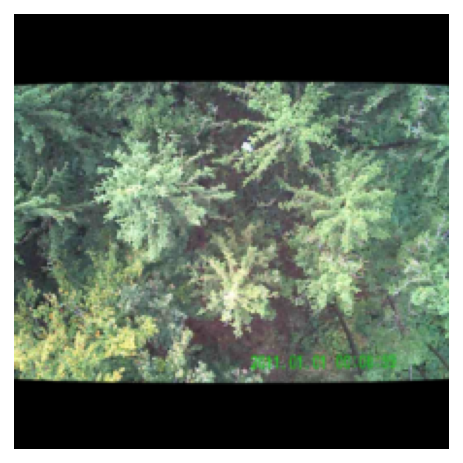

In [43]:
images, labels = next(iter(dataloader))
imshow(images[0], normalize=False);

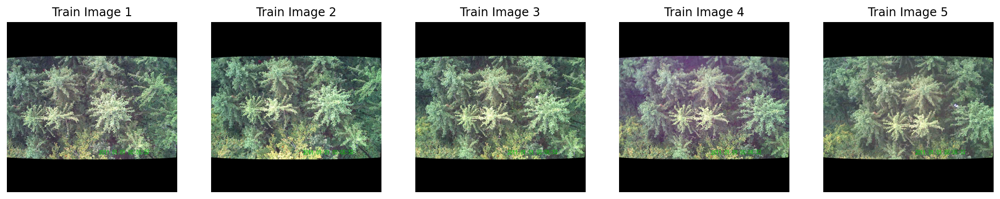

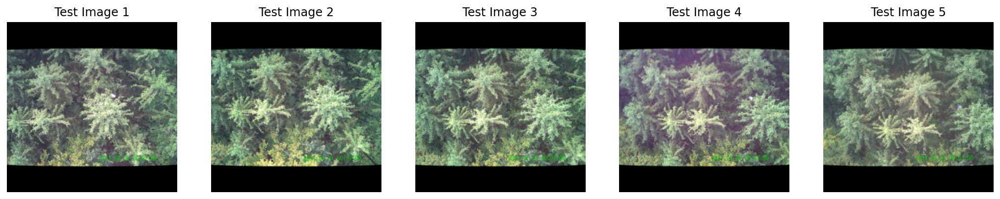

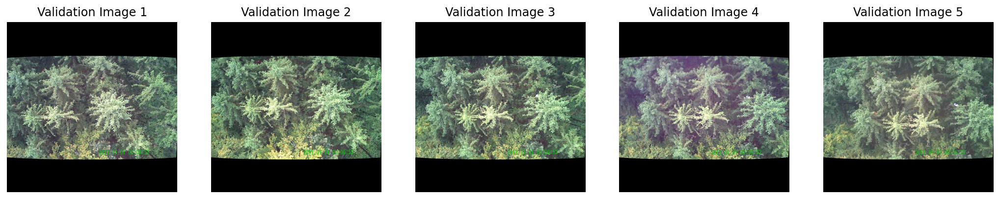

In [55]:
for loader_str, loader in [('Train Image', trainloader), 
                           ('Test Image', testloader),
                          ('Validation Image', validationloader)]:
    data_iter = iter(loader)

    images, labels = next(data_iter)
    
    ncol = 5
    fig, axes = plt.subplots(figsize=(18,10), 
                             ncols=ncol)
    for ii in range(ncol):
        ax = axes[ii]
        imshow(images[ii], 
               ax=ax, 
               normalize=True)
        ax.set_title('{} {}'.format(loader_str, ii+1))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


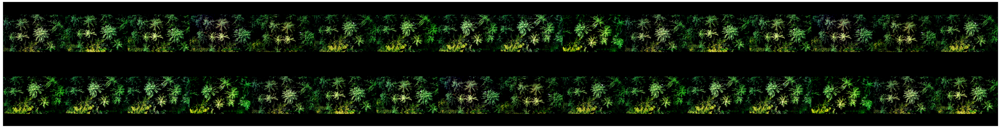

In [53]:
def show_batch(dl, invert=False):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(60, 20))
        ax.set_xticks([]); ax.set_yticks([])
        data = 1-images if invert else images
        ax.imshow(make_grid(data, nrow=16).permute(1, 2, 0))
        break
        
show_batch(trainloader)
